In [ ]:
!pip uninstall -y tensorflow


Found existing installation: tensorflow 2.18.0
Uninstalling tensorflow-2.18.0:
  Successfully uninstalled tensorflow-2.18.0


In [ ]:
pip install tensorflow==2.13.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.2/524.2 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 58.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 72.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 75.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.8/440.8 kB 35.8 MB/s eta 0:00:00
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.12.2
    Uninstalling typing_extensions-4.12.2:
      Successfully uninstalled typing_extensions-4.12.2
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
  Attempting uninstall: keras
    Found existing installation: keras 3.8.0
    Uninstalling keras-3.8.0:
      Successfully uninstalled keras-3.8.0
  Attempting uninstall: gast
    Found existing installation: gast 0.6.0
    Uninstalling gast-0.6.0:
      

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: Error: credential propagation was unsuccessful

In [ ]:
import tensorflow as tf
print(tf.__version__)

In [ ]:
import os

In [ ]:
CUSTOM_MODEL_NAME = 'my_ssd_mobnet'
PRETRAINED_MODEL_NAME = 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8'
PRETRAINED_MODEL_URL = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz'
TF_RECORD_SCRIPT_NAME = 'generate_tfrecord.py'
LABEL_MAP_NAME = 'label_map.pbtxt'

In [ ]:
paths = {
    'WORKSPACE_PATH': os.path.join('Tensorflow', 'workspace'),
    'SCRIPTS_PATH': os.path.join('Tensorflow','scripts'),
    'APIMODEL_PATH': os.path.join('Tensorflow','models'),
    'ANNOTATION_PATH': os.path.join('Tensorflow', 'workspace','annotations'),
    'IMAGE_PATH': os.path.join('Tensorflow', 'workspace','images'),
    'MODEL_PATH': os.path.join('Tensorflow', 'workspace','models'),
    'PRETRAINED_MODEL_PATH': os.path.join('Tensorflow', 'workspace','pre-trained-models'),
    'CHECKPOINT_PATH': os.path.join('Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME),
    'OUTPUT_PATH': os.path.join('Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME, 'export'),
    'TFJS_PATH':os.path.join('Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME, 'tfjsexport'),
    'TFLITE_PATH':os.path.join('Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME, 'tfliteexport'),
    'PROTOC_PATH':os.path.join('Tensorflow','protoc')
 }

In [ ]:
files = {
    'PIPELINE_CONFIG':os.path.join('Tensorflow', 'workspace','models', CUSTOM_MODEL_NAME, 'pipeline.config'),
    'TF_RECORD_SCRIPT': os.path.join(paths['SCRIPTS_PATH'], TF_RECORD_SCRIPT_NAME),
    'LABELMAP': os.path.join(paths['ANNOTATION_PATH'], LABEL_MAP_NAME)
}

In [ ]:
for path in paths.values():
    if not os.path.exists(path):
        if os.name == 'posix':
            !mkdir -p {path}
        if os.name == 'nt':
            !mkdir {path}

In [ ]:
# if os.name=='nt':
!pip install wget
import wget

In [ ]:
if not os.path.exists(os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection')):
    !git clone https://github.com/tensorflow/models {paths['APIMODEL_PATH']}

In [ ]:
import wget
import os

# Define the URL for protobuf compiler (protoc)
url = "https://github.com/protocolbuffers/protobuf/releases/download/v27.2/protoc-27.2-linux-x86_64.zip"

# Download protoc zip file
protoc_zip = wget.download(url)

# Move the downloaded file to the specified PROTOC_PATH
!mv {protoc_zip} {paths['PROTOC_PATH']}

# Navigate to the PROTOC_PATH and unzip protoc
!cd {paths['PROTOC_PATH']} && unzip {protoc_zip}

# Add the protoc binary directory to the PATH environment variable
os.environ['PATH'] += os.pathsep + os.path.abspath(os.path.join(paths['PROTOC_PATH'], 'bin'))
# Navigate to the TensorFlow Object Detection API directory and compile protobuf files
!cd Tensorflow/models/research && \
    protoc object_detection/protos/*.proto --python_out=.
# Copy setup.py script to the research directory
!cd Tensorflow/models/research && \
    cp object_detection/packages/tf2/setup.py .

# Build and install the Object Detection API
!cd Tensorflow/models/research && \
    python setup.py build && \
    python setup.py install
# Navigate to the slim directory and install tf_slim
!cd Tensorflow/models/research/slim && \
    pip install -e .


In [ ]:
!protoc --version

In [ ]:
import sys
sys.path.append('/content/Tensorflow/models/research')
import object_detection

In [ ]:
!pip list

In [ ]:
if os.name =='posix':
    !wget {PRETRAINED_MODEL_URL}
    !mv {PRETRAINED_MODEL_NAME+'.tar.gz'} {paths['PRETRAINED_MODEL_PATH']}
    !cd {paths['PRETRAINED_MODEL_PATH']} && tar -zxvf {PRETRAINED_MODEL_NAME+'.tar.gz'}
if os.name == 'nt':
    wget.download(PRETRAINED_MODEL_URL)
    !move {PRETRAINED_MODEL_NAME+'.tar.gz'} {paths['PRETRAINED_MODEL_PATH']}
    !cd {paths['PRETRAINED_MODEL_PATH']} && tar -zxvf {PRETRAINED_MODEL_NAME+'.tar.gz'}

In [ ]:
labels = [{'name':'halo', 'id':1}, {'name':'terimakasih', 'id':2}, {'name':'tolong', 'id':3}]

with open(files['LABELMAP'], 'w') as f:
    for label in labels:
        f.write('item { \n')
        f.write('\tname:\'{}\'\n'.format(label['name']))
        f.write('\tid:{}\n'.format(label['id']))
        f.write('}\n')

In [ ]:
# OPTIONAL IF RUNNING ON COLAB
ARCHIVE_FILES = os.path.join(paths['IMAGE_PATH'], 'archive.tar.gz')
if os.path.exists(ARCHIVE_FILES):
  !tar -zxvf {ARCHIVE_FILES}

In [ ]:
import shutil
import os

# Sumber folder yang ingin disalin
source_folders = [
    # '/content/drive/MyDrive/FTI/Skripsi/Model/image update/test',
    # '/content/drive/MyDrive/FTI/Skripsi/Model/image update/train',
    '/content/drive/MyDrive/FTI/Skripsi/Model/images/test',
    '/content/drive/MyDrive/FTI/Skripsi/Model/images/train'
]

# Tujuan folder
destination_folder = '/content/Tensorflow/workspace/images/'

# Membuat folder tujuan jika belum ada
os.makedirs(destination_folder, exist_ok=True)

# Menyalin folder satu per satu
for source_folder in source_folders:
    # Mengambil nama folder dari path sumber
    folder_name = os.path.basename(source_folder)
    # Menentukan path tujuan untuk folder yang disalin
    destination_path = os.path.join(destination_folder, folder_name)
    # Menyalin folder
    shutil.copytree(source_folder, destination_path, dirs_exist_ok=True)


In [ ]:
if not os.path.exists(files['TF_RECORD_SCRIPT']):
    !git clone https://github.com/nicknochnack/GenerateTFRecord {paths['SCRIPTS_PATH']}

In [ ]:
!python {files['TF_RECORD_SCRIPT']} -x {os.path.join(paths['IMAGE_PATH'], 'train')} -l {files['LABELMAP']} -o {os.path.join(paths['ANNOTATION_PATH'], 'train.record')}
!python {files['TF_RECORD_SCRIPT']} -x {os.path.join(paths['IMAGE_PATH'], 'test')} -l {files['LABELMAP']} -o {os.path.join(paths['ANNOTATION_PATH'], 'test.record')}

In [ ]:
if os.name =='posix':
    !cp {os.path.join(paths['PRETRAINED_MODEL_PATH'], PRETRAINED_MODEL_NAME, 'pipeline.config')} {os.path.join(paths['CHECKPOINT_PATH'])}
if os.name == 'nt':
    !copy {os.path.join(paths['PRETRAINED_MODEL_PATH'], PRETRAINED_MODEL_NAME, 'pipeline.config')} {os.path.join(paths['CHECKPOINT_PATH'])}

In [ ]:
import tensorflow as tf
from object_detection.utils import config_util
from object_detection.protos import pipeline_pb2
from google.protobuf import text_format

In [ ]:
config = config_util.get_configs_from_pipeline_file(files['PIPELINE_CONFIG'])

In [ ]:
config

In [ ]:
pipeline_config = pipeline_pb2.TrainEvalPipelineConfig()
with tf.io.gfile.GFile(files['PIPELINE_CONFIG'], "r") as f:
    proto_str = f.read()
    text_format.Merge(proto_str, pipeline_config)

In [ ]:
pipeline_config.model.ssd.num_classes = len(labels)
pipeline_config.train_config.batch_size = 4
pipeline_config.train_config.fine_tune_checkpoint = os.path.join(paths['PRETRAINED_MODEL_PATH'], PRETRAINED_MODEL_NAME, 'checkpoint', 'ckpt-0')
pipeline_config.train_config.fine_tune_checkpoint_type = "detection"
pipeline_config.train_input_reader.label_map_path= files['LABELMAP']
pipeline_config.train_input_reader.tf_record_input_reader.input_path[:] = [os.path.join(paths['ANNOTATION_PATH'], 'train.record')]
pipeline_config.eval_input_reader[0].label_map_path = files['LABELMAP']
pipeline_config.eval_input_reader[0].tf_record_input_reader.input_path[:] = [os.path.join(paths['ANNOTATION_PATH'], 'test.record')]

In [ ]:
config_text = text_format.MessageToString(pipeline_config)
with tf.io.gfile.GFile(files['PIPELINE_CONFIG'], "wb") as f:
    f.write(config_text)

# 6. Train the model

In [ ]:
TRAINING_SCRIPT = os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection', 'model_main_tf2.py')

In [ ]:
command = "python {} --model_dir={} --pipeline_config_path={} --num_train_steps=1".format(TRAINING_SCRIPT, paths['CHECKPOINT_PATH'],files['PIPELINE_CONFIG'])

In [ ]:
print(command)

python Tensorflow/models/research/object_detection/model_main_tf2.py --model_dir=Tensorflow/workspace/models/my_ssd_mobnet --pipeline_config_path=Tensorflow/workspace/models/my_ssd_mobnet/pipeline.config --num_train_steps=1


In [ ]:
!{command}

2024-08-28 17:25:52.277556: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)
I0828 17:25:57.518416 132612910796800 mirrored_strategy.py:419] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 1
I0828 17:25:57.652225 132612910796800 config_util.py:552] Maybe overwriting train_steps: 1
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0828 17:25:57.652466 132612910796800 config_util.py:552] Maybe overwriting use_bfloat16: False
Instructions for updating:
rename to distribute_datasets_from_function
W0828 17:25:57.690545 132612910796800 deprecation.py:364] From /usr/local/lib/python3.10/dist-packages/object_detection-0.1-py3.10.egg/object_detection/model_lib_v2.py:563: StrategyBase.experimental_distribute_datasets_from_function (from tensorflow.python.distri

# 7. Evaluate the Model

In [ ]:
command = "python {} --model_dir={} --pipeline_config_path={} --checkpoint_dir={}".format(TRAINING_SCRIPT, paths['CHECKPOINT_PATH'],files['PIPELINE_CONFIG'], paths['CHECKPOINT_PATH'])

In [ ]:
print(command)

python Tensorflow/models/research/object_detection/model_main_tf2.py --model_dir=Tensorflow/workspace/models/my_ssd_mobnet --pipeline_config_path=Tensorflow/workspace/models/my_ssd_mobnet/pipeline.config --checkpoint_dir=Tensorflow/workspace/models/my_ssd_mobnet


In [ ]:
!{command}

2024-08-27 22:29:24.341778: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
W0827 22:29:31.166113 137714148061184 model_lib_v2.py:1089] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I0827 22:29:31.166472 137714148061184 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0827 22:29:31.166578 137714148061184 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I0827 22:29:31.166675 137714148061184 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W0827 22:29:31.166842 137714148061184 model_lib_v2.py:1106] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
INFO:tensorflow:Reading unweighted datasets: ['Tensorflow/workspace/annotations

In [ ]:
!pip install tensorboard
!pip install pyngrok

In [ ]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)

!pip show tensorboard


TensorFlow version: 2.13.0
Name: tensorboard
Version: 2.13.0
Summary: TensorBoard lets you watch Tensors Flow
Home-page: https://github.com/tensorflow/tensorboard
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: absl-py, google-auth, google-auth-oauthlib, grpcio, markdown, numpy, protobuf, requests, setuptools, tensorboard-data-server, werkzeug, wheel
Required-by: tensorflow


In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir /content/Tensorflow/workspace/models/my_ssd_mobnet

<IPython.core.display.Javascript object>

# 8. Load Train Model From Checkpoint

In [ ]:
!pip install tf-models-official==2.10.0

INFO: pip is looking at multiple versions of tf-models-official to determine which version is compatible with other requirements. This could take a while.
ERROR: Ignored the following yanked versions: 3.4.11.39, 3.4.11.41, 4.4.0.40, 4.4.0.42, 4.4.0.44, 4.5.5.62, 4.7.0.68, 4.8.0.74
ERROR: Could not find a version that satisfies the requirement opencv-python-headless==4.5.2.52 (from tf-models-official) (from versions: 3.4.10.37, 3.4.11.43, 3.4.11.45, 3.4.13.47, 3.4.15.55, 3.4.16.59, 3.4.17.61, 3.4.17.63, 3.4.18.65, 4.3.0.38, 4.4.0.46, 4.5.1.48, 4.5.3.56, 4.5.4.58, 4.5.4.60, 4.5.5.64, 4.6.0.66, 4.7.0.72, 4.8.0.76, 4.8.1.78, 4.9.0.80, 4.10.0.82, 4.10.0.84)
ERROR: No matching distribution found for opencv-python-headless==4.5.2.52


In [ ]:
!pip install tensorflow-io

In [ ]:
import os
import tensorflow as tf
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder
from object_detection.utils import config_util

In [ ]:
# Load pipeline config and build a detection model
configs = config_util.get_configs_from_pipeline_file(files['PIPELINE_CONFIG'])
detection_model = model_builder.build(model_config=configs['model'], is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
ckpt.restore(os.path.join(paths['CHECKPOINT_PATH'], 'ckpt-3')).expect_partial()

@tf.function
def detect_fn(image):
    image, shapes = detection_model.preprocess(image)
    prediction_dict = detection_model.predict(image, shapes)
    detections = detection_model.postprocess(prediction_dict, shapes)
    return detections

In [ ]:
!pip uninstall -y opencv-python
!pip uninstall -y opencv-python-headless
!pip install opencv-python

Found existing installation: opencv-python 4.10.0.84
Uninstalling opencv-python-4.10.0.84:
  Successfully uninstalled opencv-python-4.10.0.84
  Using cached opencv_python-4.10.0.84-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
Using cached opencv_python-4.10.0.84-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (62.5 MB)


In [ ]:
import os
from PIL import Image

# Define the base path where images are stored
BASE_PATH = '/content/Tensorflow/workspace/images/live'
OUTPUT_PATH = '/content/Tensorflow/workspace/images/sidang'

# Ensure the output path exists
os.makedirs(OUTPUT_PATH, exist_ok=True)

# Define the desired size for the images
IMAGE_SIZE = (640, 480)  # Width, Height

def process_image(input_path, output_path):
    # Open an image file
    try:
        with Image.open(input_path) as img:
            # Resize image
            img = img.resize(IMAGE_SIZE, Image.ANTIALIAS)
            # Save image to output path
            img.save(output_path)
            print(f"Processed and saved {input_path} to {output_path}")
    except Exception as e:
        print(f"Error processing {input_path}: {e}")

# Iterate over all files in the base path
for filename in os.listdir(BASE_PATH):
    input_file = os.path.join(BASE_PATH, filename)
    output_file = os.path.join(OUTPUT_PATH, filename)

    # Check if the file is an image (you can add more extensions if needed)
    if os.path.isfile(input_file) and filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
        process_image(input_file, output_file)

print("Image processing complete.")


In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline

In [ ]:
category_index = label_map_util.create_category_index_from_labelmap(files['LABELMAP'])

In [ ]:
TEST_IMAGE_DIR = '/content/Tensorflow/workspace/images/sidang/'

In [ ]:
TEST_IMAGE_DIR

'/content/Tensorflow/workspace/images/sidang/'

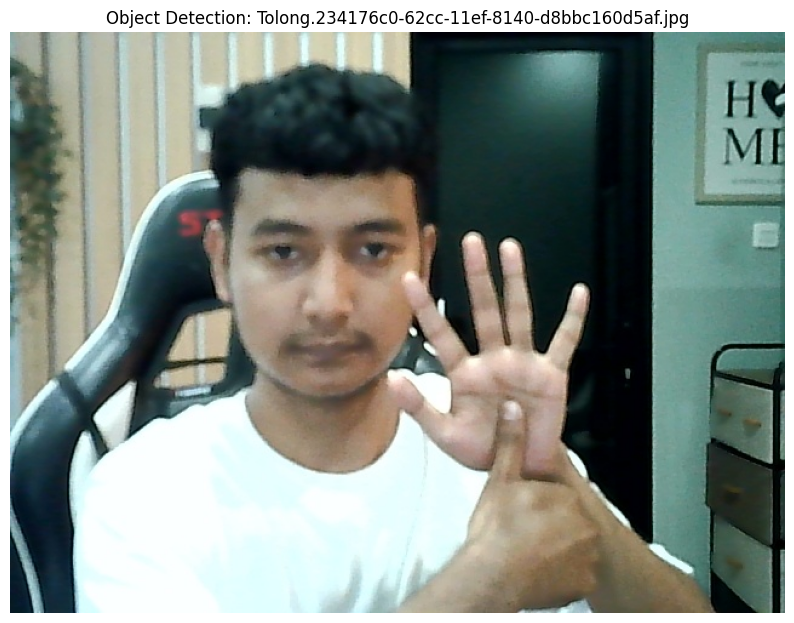

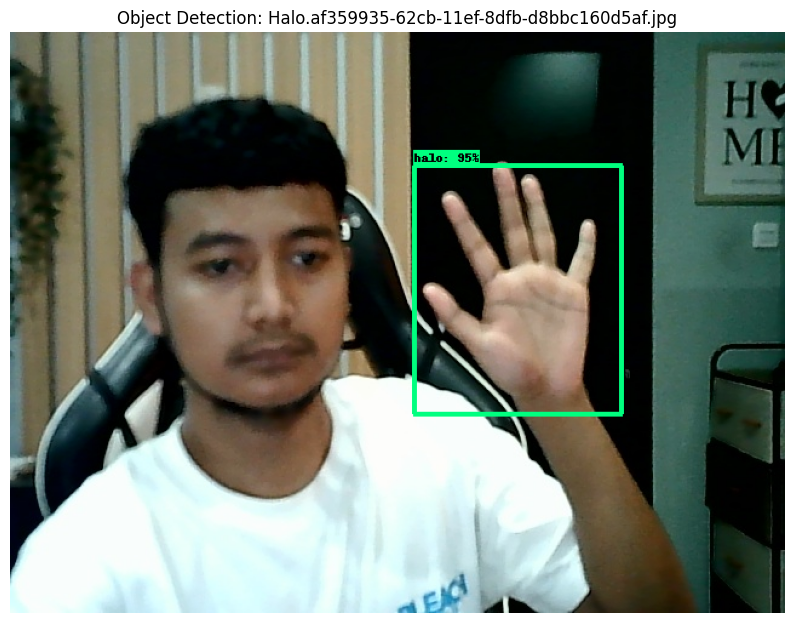

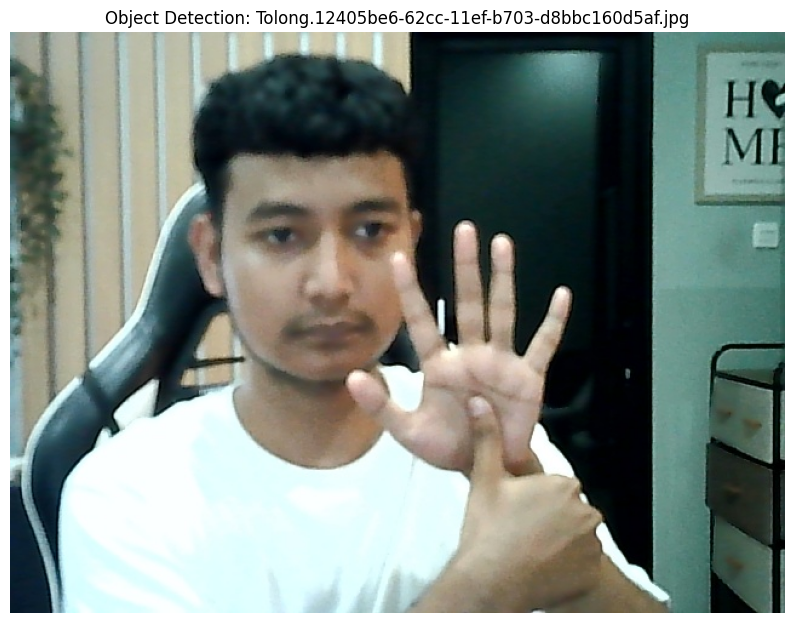

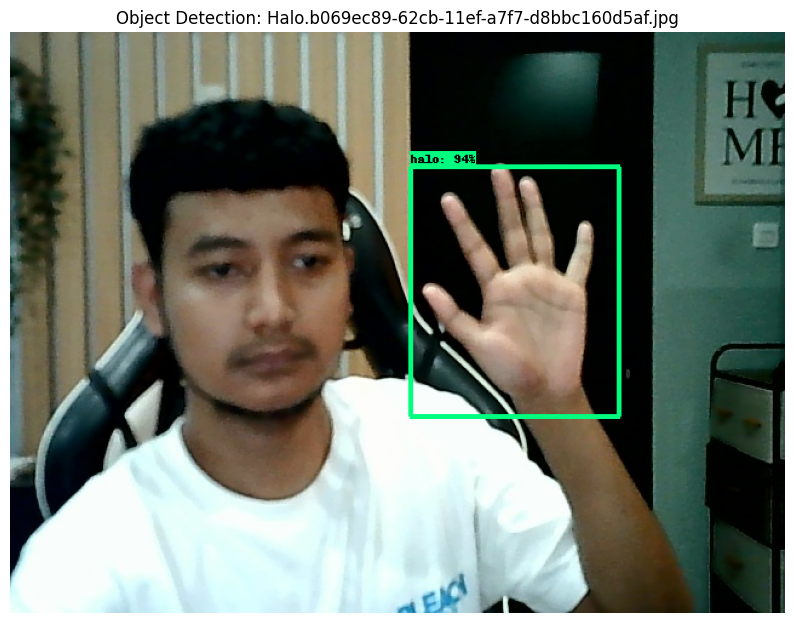

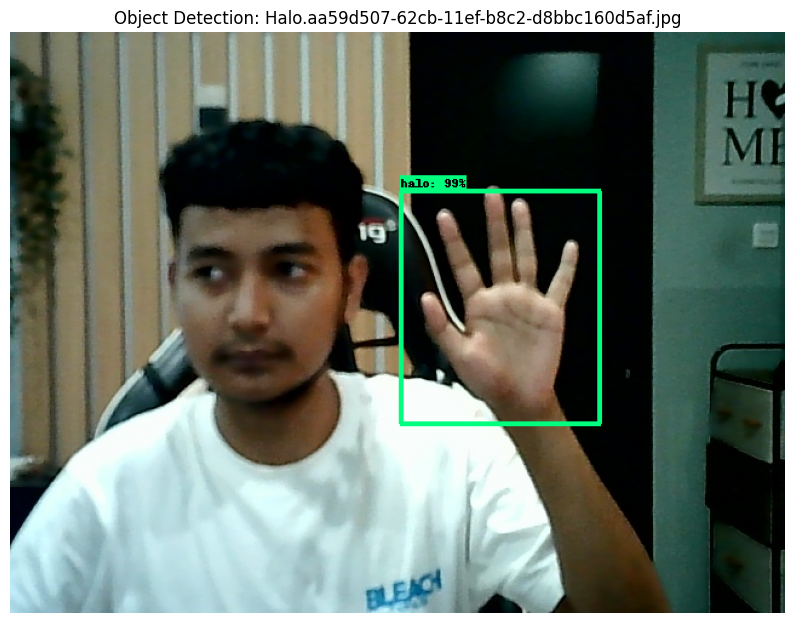

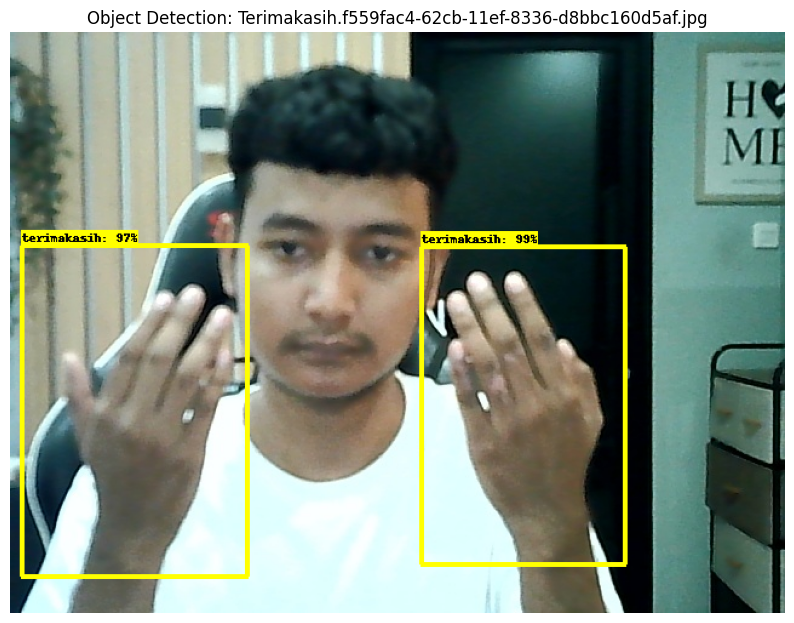

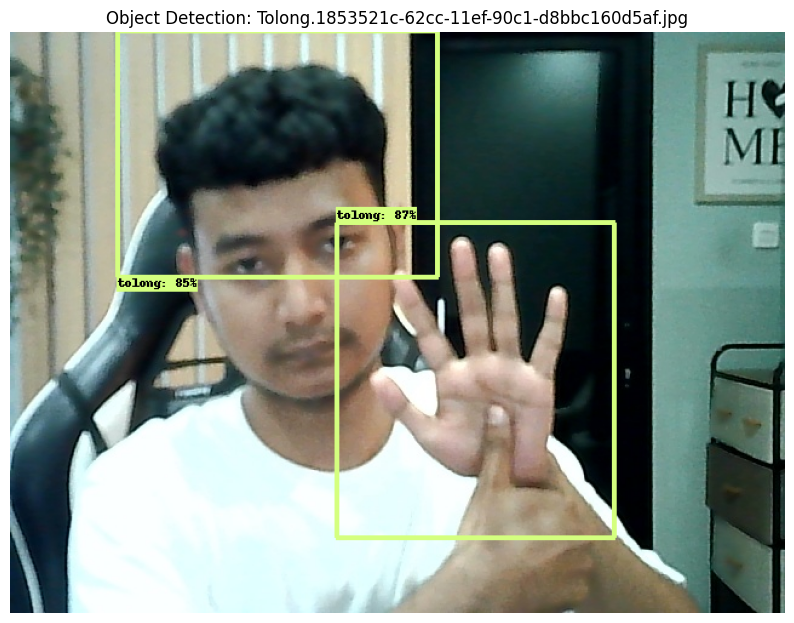

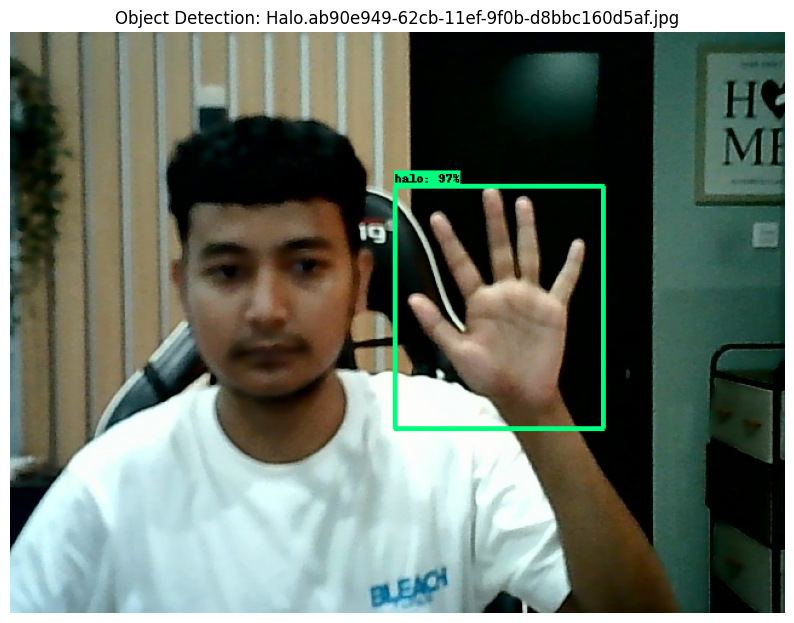

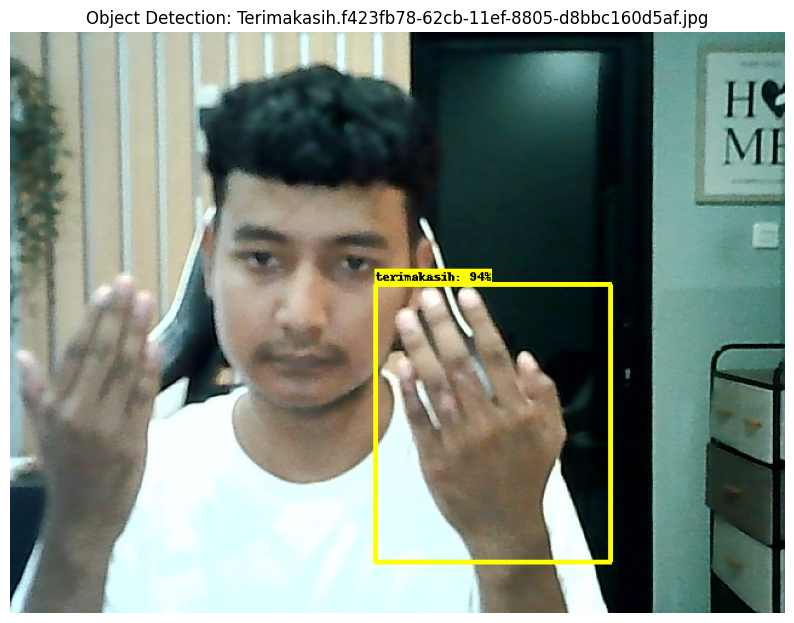

In [ ]:
# Loop melalui semua gambar dalam direktori test
for filename in os.listdir(TEST_IMAGE_DIR):
    if filename.endswith('.jpg') or filename.endswith('.jpeg') or filename.endswith('.png'):
        IMAGE_PATH = os.path.join(TEST_IMAGE_DIR, filename)

        # Baca gambar
        img = cv2.imread(IMAGE_PATH)
        image_np = np.array(img)

        # Konversi gambar ke tensor
        input_tensor = tf.convert_to_tensor(np.expand_dims(image_np, 0), dtype=tf.float32)

        # Deteksi objek
        detections = detect_fn(input_tensor)

        # Ambil jumlah deteksi
        num_detections = int(detections.pop('num_detections'))
        detections = {key: value[0, :num_detections].numpy() for key, value in detections.items()}
        detections['num_detections'] = num_detections

        # detection_classes harus berupa integer
        detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

        # Visualisasi kotak dan label deteksi pada gambar
        image_np_with_detections = image_np.copy()
        viz_utils.visualize_boxes_and_labels_on_image_array(
            image_np_with_detections,
            detections['detection_boxes'],
            detections['detection_classes'] + 1,  # tambahkan 1 karena label_id_offset
            detections['detection_scores'],
            category_index,
            use_normalized_coordinates=True,
            max_boxes_to_draw=5,
            min_score_thresh=0.8,
            agnostic_mode=False)

        # Tampilkan gambar dengan kotak deteksi dan label
        plt.figure(figsize=(10, 8))
        plt.imshow(cv2.cvtColor(image_np_with_detections, cv2.COLOR_BGR2RGB))
        plt.title(f'Object Detection: {filename}')
        plt.axis('off')
        plt.show()

In [ ]:
IMAGE_PATH = os.path.join(paths['IMAGE_PATH'], 'coba', '1.jpg')

In [ ]:
IMAGE_PATH

'Tensorflow/workspace/images/coba/1.jpg'

In [ ]:
img = cv2.imread(IMAGE_PATH)
image_np = np.array(img)

input_tensor = tf.convert_to_tensor(np.expand_dims(image_np, 0), dtype=tf.float32)
detections = detect_fn(input_tensor)

num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
              for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
            image_np_with_detections,
            detections['detection_boxes'],
            detections['detection_classes']+label_id_offset,
            detections['detection_scores'],
            category_index,
            use_normalized_coordinates=True,
            max_boxes_to_draw=5,
            min_score_thresh=.8,
            agnostic_mode=False)

plt.imshow(cv2.cvtColor(image_np_with_detections, cv2.COLOR_BGR2RGB))
plt.show()

NameError: name 'cv2' is not defined

In [ ]:
import cv2
import numpy as np

# Membaca gambar dengan OpenCV
img = cv2.imread('/content/Tensorflow/workspace/images/coba/WhatsApp Image 2024-08-27 at 13.17.16.jpeg')

# Jika gambar memiliki 1 saluran (grayscale), ubah ke RGB
if img.ndim == 2:
    img_rgb = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
# Jika gambar memiliki 4 saluran (misalnya, RGBA), ubah ke RGB
elif img.shape[2] == 4:
    img_rgb = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)
else:
    img_rgb = img

# Menyimpan gambar RGB
cv2.imwrite('/content/Tensorflow/workspace/images/coba/1.jpg', img_rgb)

ImportError: No module named 'cv2'

In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from matplotlib import pyplot as plt
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
import zipfile

# Path ke label map dan model yang sudah Anda siapkan
LABELMAP_PATH = '/content/Tensorflow/workspace/annotations/label_map.pbtxt'
MODEL_PATH = '/content/Tensorflow/workspace/models/my_ssd_mobnet/saved_model'

# Load label map
label_map = label_map_util.load_labelmap(LABELMAP_PATH)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=90, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

# Path ke direktori gambar test
TEST_IMAGE_DIR = '/content/Tensorflow/workspace/images/test/'

# Path ke direktori hasil
OUTPUT_DIR = '/content/Tensorflow/workspace/images/hasil/'
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Loop melalui semua gambar dalam direktori test
for filename in os.listdir(TEST_IMAGE_DIR):
    if filename.endswith('.jpg') or filename.endswith('.jpeg') or filename.endswith('.png'):
        IMAGE_PATH = os.path.join(TEST_IMAGE_DIR, filename)

        # Baca gambar
        img = cv2.imread(IMAGE_PATH)
        image_np = np.array(img)

        # Konversi gambar ke tensor
        input_tensor = tf.convert_to_tensor(np.expand_dims(image_np, 0), dtype=tf.float32)

        # Deteksi objek
        detections = detect_fn(input_tensor)

        # Ambil jumlah deteksi
        num_detections = int(detections.pop('num_detections'))
        detections = {key: value[0, :num_detections].numpy() for key, value in detections.items()}
        detections['num_detections'] = num_detections

        # detection_classes harus berupa integer
        detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

        # Visualisasi kotak dan label deteksi pada gambar
        image_np_with_detections = image_np.copy()
        viz_utils.visualize_boxes_and_labels_on_image_array(
            image_np_with_detections,
            detections['detection_boxes'],
            detections['detection_classes'] + 1,  # tambahkan 1 karena label_id_offset
            detections['detection_scores'],
            category_index,
            use_normalized_coordinates=True,
            max_boxes_to_draw=5,
            min_score_thresh=0.8,
            agnostic_mode=False)

        # Simpan gambar dengan kotak deteksi dan label ke folder hasil
        output_image_path = os.path.join(OUTPUT_DIR, filename)
        cv2.imwrite(output_image_path, cv2.cvtColor(image_np_with_detections, cv2.COLOR_BGR2RGB))

        print(f"Saved image {filename} to {OUTPUT_DIR}")

print("Proses penyimpanan gambar selesai.")


Saved image Halo.6234a92d-3399-11ef-b6f3-c813877b3dc2.jpg to /content/Tensorflow/workspace/images/hasil/
Saved image Terimakasih.295b9c7a-3399-11ef-b0bc-c813877b3dc2.jpg to /content/Tensorflow/workspace/images/hasil/
Saved image Tolong.49295d50-3399-11ef-8861-c813877b3dc2.jpg to /content/Tensorflow/workspace/images/hasil/
Saved image Terimakasih.2827d81f-3399-11ef-a4e4-c813877b3dc2.jpg to /content/Tensorflow/workspace/images/hasil/
Saved image Terimakasih.3093c977-3399-11ef-9f5c-c813877b3dc2.jpg to /content/Tensorflow/workspace/images/hasil/
Saved image Halo.61011fa3-3399-11ef-8883-c813877b3dc2.jpg to /content/Tensorflow/workspace/images/hasil/
Saved image Halo.67035374-3399-11ef-a962-c813877b3dc2.jpg to /content/Tensorflow/workspace/images/hasil/
Saved image Tolong.4458da2f-3399-11ef-a01d-c813877b3dc2.jpg to /content/Tensorflow/workspace/images/hasil/
Saved image Terimakasih.342ea29d-3399-11ef-bdcc-c813877b3dc2.jpg to /content/Tensorflow/workspace/images/hasil/
Saved image Tolong.458c

In [ ]:
import zipfile
# Kompres folder hasil ke dalam file zip
zip_filename = '/content/Tensorflow/workspace/images/hasil.zip'
with zipfile.ZipFile(zip_filename, 'w') as zipf:
    for root, _, files in os.walk(OUTPUT_DIR):
        for file in files:
            zipf.write(os.path.join(root, file), os.path.relpath(os.path.join(root, file), OUTPUT_DIR))

print(f"File zip {zip_filename} telah dibuat.")

File zip /content/Tensorflow/workspace/images/hasil.zip telah dibuat.


# 10. Real Time Detections from your Webcam

In [ ]:
!pip uninstall opencv-python-headless -y

Found existing installation: opencv-python-headless 4.10.0.84
Uninstalling opencv-python-headless-4.10.0.84:
  Successfully uninstalled opencv-python-headless-4.10.0.84


In [ ]:
cap = cv2.VideoCapture(0)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

while cap.isOpened():
    ret, frame = cap.read()
    image_np = np.array(frame)

    input_tensor = tf.convert_to_tensor(np.expand_dims(image_np, 0), dtype=tf.float32)
    detections = detect_fn(input_tensor)

    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                  for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    label_id_offset = 1
    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
                image_np_with_detections,
                detections['detection_boxes'],
                detections['detection_classes']+label_id_offset,
                detections['detection_scores'],
                category_index,
                use_normalized_coordinates=True,
                max_boxes_to_draw=5,
                min_score_thresh=.8,
                agnostic_mode=False)

    cv2.imshow('object detection',  cv2.resize(image_np_with_detections, (800, 600)))

    if cv2.waitKey(10) & 0xFF == ord('q'):
        cap.release()
        cv2.destroyAllWindows()
        break

# 10. Freezing the Graph

In [ ]:
FREEZE_SCRIPT = os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection', 'exporter_main_v2.py ')

In [ ]:
command = "python {} --input_type=image_tensor --pipeline_config_path={} --trained_checkpoint_dir={} --output_directory={}".format(FREEZE_SCRIPT ,files['PIPELINE_CONFIG'], paths['CHECKPOINT_PATH'], paths['OUTPUT_PATH'])

In [ ]:
print(command)

python Tensorflow/models/research/object_detection/exporter_main_v2.py  --input_type=image_tensor --pipeline_config_path=Tensorflow/workspace/models/my_ssd_mobnet/pipeline.config --trained_checkpoint_dir=Tensorflow/workspace/models/my_ssd_mobnet --output_directory=Tensorflow/workspace/models/my_ssd_mobnet/export


In [ ]:
!{command}

2024-08-27 22:53:33.623337: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0827 22:53:40.210914 137496902115328 deprecation.py:641] From /usr/local/lib/python3.10/dist-packages/tensorflow/python/autograph/impl/api.py:459: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with back_prop=False is deprecated and will be removed in a future version.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
I0827 22:53:46.903791 137496902115328 api.py:460] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
I08

# 11. Conversion to TFJS

In [ ]:
!pip install tensorflowjs

  Using cached tensorflow-2.17.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.2 kB)
  Using cached tensorboard-2.17.1-py3-none-any.whl.metadata (1.6 kB)
  Using cached keras-3.5.0-py3-none-any.whl.metadata (5.8 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.5/15.5 MB 46.8 MB/s eta 0:00:00
Using cached tensorflow-2.17.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (601.3 MB)
Using cached keras-3.5.0-py3-none-any.whl (1.1 MB)
Using cached tensorboard-2.17.1-py3-none-any.whl (5.5 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 56.2 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.1
    Uninstalling packaging-24.1:
      Successfully uninstalled packaging-24.1
  Attempting uninstall: tensorboard
    Found existing installation: tensorb

In [ ]:
command = "tensorflowjs_converter --input_format=tf_saved_model --output_node_names='detection_boxes,detection_classes,detection_features,detection_multiclass_scores,detection_scores,num_detections,raw_detection_boxes,raw_detection_scores' --output_format=tfjs_graph_model --signature_name=serving_default {} {}".format(os.path.join(paths['OUTPUT_PATH'], 'saved_model'), paths['TFJS_PATH'])

In [ ]:
print(command)

tensorflowjs_converter --input_format=tf_saved_model --output_node_names='detection_boxes,detection_classes,detection_features,detection_multiclass_scores,detection_scores,num_detections,raw_detection_boxes,raw_detection_scores' --output_format=tfjs_graph_model --signature_name=serving_default Tensorflow/workspace/models/my_ssd_mobnet/export/saved_model Tensorflow/workspace/models/my_ssd_mobnet/tfjsexport


In [ ]:
!{command}

2024-08-27 22:59:23.020487: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-27 22:59:23.048149: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-27 22:59:23.056187: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-08-27 22:59:23.077077: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-08-27 22:59:25.149325: W tensorflow/compiler/tf2

In [ ]:
# Test Code: https://github.com/nicknochnack/RealTimeSignLanguageDetectionwithTFJS

# 12. Conversion to TFLite

In [ ]:
TFLITE_SCRIPT = os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection', 'export_tflite_graph_tf2.py ')

In [ ]:
command = "python {} --pipeline_config_path={} --trained_checkpoint_dir={} --output_directory={}".format(TFLITE_SCRIPT ,files['PIPELINE_CONFIG'], paths['CHECKPOINT_PATH'], paths['TFLITE_PATH'])

In [ ]:
print(command)

python Tensorflow/models/research/object_detection/export_tflite_graph_tf2.py  --pipeline_config_path=Tensorflow/workspace/models/my_ssd_mobnet/pipeline.config --trained_checkpoint_dir=Tensorflow/workspace/models/my_ssd_mobnet --output_directory=Tensorflow/workspace/models/my_ssd_mobnet/tfliteexport


In [ ]:
!{command}

2024-08-27 23:01:16.099276: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-27 23:01:16.130404: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-27 23:01:16.139121: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-08-27 23:01:16.160910: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-08-27 23:01:17.976437: W tensorflow/compiler/tf2

In [ ]:
FROZEN_TFLITE_PATH = os.path.join(paths['TFLITE_PATH'], 'saved_model')
TFLITE_MODEL = os.path.join(paths['TFLITE_PATH'], 'saved_model', 'detect.tflite')

In [ ]:
command = "tflite_convert \
--saved_model_dir={} \
--output_file={} \
--input_shapes=1,300,300,3 \
--input_arrays=normalized_input_image_tensor \
--output_arrays='TFLite_Detection_PostProcess','TFLite_Detection_PostProcess:1','TFLite_Detection_PostProcess:2','TFLite_Detection_PostProcess:3' \
--inference_type=FLOAT \
--allow_custom_ops".format(FROZEN_TFLITE_PATH, TFLITE_MODEL, )

In [ ]:
print(command)

tflite_convert --saved_model_dir=Tensorflow/workspace/models/my_ssd_mobnet/tfliteexport/saved_model --output_file=Tensorflow/workspace/models/my_ssd_mobnet/tfliteexport/saved_model/detect.tflite --input_shapes=1,300,300,3 --input_arrays=normalized_input_image_tensor --output_arrays='TFLite_Detection_PostProcess','TFLite_Detection_PostProcess:1','TFLite_Detection_PostProcess:2','TFLite_Detection_PostProcess:3' --inference_type=FLOAT --allow_custom_ops


In [ ]:
!{command}

2024-07-02 15:00:44.805787: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:479] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-02 15:00:44.880923: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:10575] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-02 15:00:44.881038: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1442] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-02 15:00:47.720038: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Traceback (most recent call last):
  File "/usr/local/bin/tflite_convert", line 8, in <module>
    sys.exit(main())
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/lite/python/tflite_convert.py", line 692, in main
    app.run(mai

# 13. Zip and Export Models

In [ ]:
!tar -czf models.tar.gz {paths['CHECKPOINT_PATH']}

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile
import os

# Path ke folder yang ingin Anda kompres
folder_path = '/content/Tensorflow'

# Nama file ZIP yang ingin Anda simpan
zip_file = '/content/Tensorflow-fix28-08-2024.zip'

# Kompresi folder menjadi file ZIP
def zip_folder(folder_path, zip_file):
    with zipfile.ZipFile(zip_file, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                zipf.write(os.path.join(root, file), os.path.relpath(os.path.join(root, file), folder_path))

# Panggil fungsi untuk mengompres folder
zip_folder(folder_path, zip_file)


In [ ]:
# Path dari file ZIP yang sudah diompres
zip_file_path = '/content/Tensorflow-fix28-08-2024.zip'

# Path tujuan di Google Drive
destination_drive_path = '/content/drive/MyDrive/FTI/Skripsi'

# Menyalin file ZIP ke Google Drive
!cp "{zip_file_path}" "{destination_drive_path}"


In [ ]:
%pip install gdown

In [ ]:
import gdown
import zipfile
import os

# Tentukan URL unduhan dan nama file output
url = 'https://drive.google.com/file/d/1ufac8EUVC2vkxjwZU81-ILx2HdRslyGS/view?usp=sharing'
output_zip = 'Tensorflow-fix28-08-2024.zip'

# Tentukan nama folder untuk hasil ekstraksi
extracted_folder = 'Tensorflow'

# Unduh file zip
gdown.download(url, output_zip, quiet=False)

# Ekstrak file zip ke folder yang ditentukan
with zipfile.ZipFile(output_zip, 'r') as zip_ref:
    zip_ref.extractall(extracted_folder)

# Hapus file zip setelah diekstrak (opsional)
os.remove(output_zip)

# Daftar file yang diekstrak
extracted_files = os.listdir(extracted_folder)
print("File yang diekstrak:", extracted_files)


In [ ]:
import zipfile
import os

# Define the path to your ZIP file and the extraction folder
zip_path = '/content/drive/MyDrive/FTI/Skripsi/Tensorflow-fix28-08-2024.zip'
extract_to = '/content/Tensorflow/'

# Create the extraction folder if it does not exist
os.makedirs(extract_to, exist_ok=True)

# Extract the ZIP file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f"Extracted files to: {extract_to}")


Extracted files to: /content/Tensorflow/
